In [1]:
from PIL import Image
from pathlib import Path
from tqdm import tqdm
import random

import torch
import torch.nn
import torchvision.models as models
from torch.autograd import Variable 
import torchvision.transforms as transforms

import os
import time
import math
from math import log2
import numpy as np
import pandas as pd

from scipy.sparse import issparse, isspmatrix_csr, csr_matrix, spmatrix
import matplotlib.pyplot as plt
from scipy import sparse
from scipy.spatial import distance
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.stats import zscore


from sklearn import metrics
from sklearn.metrics import pairwise_distances,silhouette_samples
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA, NMF, TruncatedSVD, FactorAnalysis, LatentDirichletAllocation, sparse_encode
from sklearn.datasets import load_iris
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import kneighbors_graph

import collections
import umap
import anndata
import random
import scanpy as sc

from sklearn.cluster import AgglomerativeClustering


/opt/conda/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/opt/conda/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/opt/conda/lib/python3.10/site-packages/umap/distances.py:1086: NumbaDeprecationWarning: The 'nopython' keyword argume

In [2]:
# Please enter the folder path of the file and the file name
data_path = 'the folder path of the file'
count_file ='the file name.h5'

In [3]:
# weight parameter
## Iterative Refine Spatial-Temporal Domain
weight_sc = 0.8
## Reconstruction of developmental path
weight_sr = 0.3
weight_dis = 0.6
weight_corr = 0.1

# Data Preprocessing

## load data

In [7]:
def read_10X_Visium(path, 
                    genome=None,
                    count_file=count_file, 
                    library_id=None, 
                    load_images=True, 
                    quality='hires',
                    image_path = None):
    adata = sc.read_visium(path, 
                        genome=genome,
                        count_file=count_file,
                        library_id=library_id,
                        load_images=load_images)
    adata.var_names_make_unique()

    if library_id is None:
        library_id = list(adata.uns["spatial"].keys())[0]
    if quality == "fulres":
        image_coor = adata.obsm["spatial"]
        img = plt.imread(image_path, 0)
        adata.uns["spatial"][library_id]["images"]["fulres"] = img
    else:
        scale = adata.uns["spatial"][library_id]["scalefactors"][
            "tissue_" + quality + "_scalef"]
        
        for i in range(len(adata.obsm["spatial"]) ):
            adata.obsm["spatial"][i][0] = int(adata.obsm["spatial"][i][0])
            adata.obsm["spatial"][i][1] = int(adata.obsm["spatial"][i][1])

        image_coor = adata.obsm["spatial"] * scale
    adata.obs["imagecol"] = image_coor[:, 0]
    adata.obs["imagerow"] = image_coor[:, 1]
    adata.uns["spatial"][library_id]["use_quality"] = quality
    return adata

In [8]:
adata = read_10X_Visium(data_path)

/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1900: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1900: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
adata

AnnData object with n_obs × n_vars = 3798 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'imagecol', 'imagerow'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [5]:
# spatial location
coor = pd.DataFrame(adata.obs['imagecol'])
coor['imagerow'] = adata.obs['imagerow']

## Extract image feature

In [6]:
# slice path of image feature
def image_crop(
        adata,
        save_path,
        library_id=None,
        crop_size=50,
        target_size=224,
        verbose=False,
        ):
    if library_id is None:
       library_id = list(adata.uns["spatial"].keys())[0]

    image = adata.uns["spatial"][library_id]["images"][
            adata.uns["spatial"][library_id]["use_quality"]]
    if image.dtype == np.float32 or image.dtype == np.float64:
        image = (image * 255).astype(np.uint8)
    img_pillow = Image.fromarray(image)
    tile_names = []

    with tqdm(total=len(adata),
              desc="Tiling image",
              bar_format="{l_bar}{bar} [ time left: {remaining} ]") as pbar:
        for imagerow, imagecol in zip(adata.obs["imagerow"], adata.obs["imagecol"]):
            imagerow_down = imagerow - crop_size / 2
            imagerow_up = imagerow + crop_size / 2
            imagecol_left = imagecol - crop_size / 2
            imagecol_right = imagecol + crop_size / 2
            tile = img_pillow.crop(
                (imagecol_left, imagerow_down, imagecol_right, imagerow_up))
            tile.thumbnail((target_size, target_size), Image.LANCZOS) ##### 
            tile.resize((target_size, target_size)) ###### 
            tile_name = str(imagecol) + "-" + str(imagerow) + "-" + str(crop_size)
            out_tile = Path(save_path) / (tile_name + ".png")
            tile_names.append(str(out_tile))
            if verbose:
                print(
                    "generate tile at location ({}, {})".format(
                        str(imagecol), str(imagerow)))
            tile.save(out_tile, "PNG")
            pbar.update(1)

    adata.obs["slices_path"] = tile_names
    if verbose:
        print("The slice path of image feature is added to adata.obs['slices_path'] !")
    return adata


In [7]:
# image matrix
class image_feature:
    def __init__(
        self,
        adata,
        pca_components=50,
        cnnType='ResNet50',
        verbose=False,
        seeds=88,
    ):
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.adata = adata
        self.pca_components = pca_components
        self.verbose = verbose
        self.seeds = seeds
        self.cnnType = cnnType

    def load_cnn_model(
        self,
        ):

        if self.cnnType == 'ResNet50':
            cnn_pretrained_model = models.resnet50(pretrained=True)
            cnn_pretrained_model.to(self.device)
        elif self.cnnType == 'Resnet152':
            cnn_pretrained_model = models.resnet152(pretrained=True)
            cnn_pretrained_model.to(self.device)            
        elif self.cnnType == 'Vgg19':
            cnn_pretrained_model = models.vgg19(pretrained=True)
            cnn_pretrained_model.to(self.device)
        elif self.cnnType == 'Vgg16':
            cnn_pretrained_model = models.vgg16(pretrained=True)
            cnn_pretrained_model.to(self.device)
        elif self.cnnType == 'DenseNet121':
            cnn_pretrained_model = models.densenet121(pretrained=True)
            cnn_pretrained_model.to(self.device)
        elif self.cnnType == 'Inception_v3':
            cnn_pretrained_model = models.inception_v3(pretrained=True)
            cnn_pretrained_model.to(self.device)
        else:
            raise ValueError(
                    f"""\
                        {self.cnnType} is not a valid type.
                        """)
        return cnn_pretrained_model

    def extract_image_feat(
        self,
        ):

        transform_list = [transforms.ToTensor(),
                          transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                          std =[0.229, 0.224, 0.225]),
                          transforms.RandomAutocontrast(),
                          transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 1.)),
                          transforms.RandomInvert(),
                          transforms.RandomAdjustSharpness(random.uniform(0, 1)),
                          transforms.RandomSolarize(random.uniform(0, 1)),
                          transforms.RandomAffine(45, translate=(0.3, 0.3), scale=(0.8, 1.2), shear=(-0.3, 0.3, -0.3, 0.3)),
                          transforms.RandomErasing()
                          ]
        # transform_list = [transforms.ToTensor(),
        #                   transforms.Normalize(mean=[0.54, 0.51, 0.68], 
        #                   std =[0.25, 0.21, 0.16])]
        img_to_tensor = transforms.Compose(transform_list)

        feat_df = pd.DataFrame()
        model = self.load_cnn_model()
        #model.fc = torch.nn.LeakyReLU(0.1)
        model.eval()

        if "slices_path" not in self.adata.obs.keys():
             raise ValueError("Please run the function image_crop first")

        with tqdm(total=len(self.adata),
              desc="Extract image feature",
              bar_format="{l_bar}{bar} [ time left: {remaining} ]",) as pbar:
            for spot, slice_path in self.adata.obs['slices_path'].items():
                spot_slice = Image.open(slice_path)
                spot_slice = spot_slice.resize((224,224))
                spot_slice = np.asarray(spot_slice, dtype="int32")
                spot_slice = spot_slice.astype(np.float32)
                tensor = img_to_tensor(spot_slice)
                tensor = tensor.resize_(1,3,224,224)
                tensor = tensor.to(self.device)
                result = model(Variable(tensor))
                result_npy = result.data.cpu().numpy().ravel()
                feat_df[spot] = result_npy
                feat_df = feat_df.copy()
                pbar.update(1)
        self.adata.obsm["image_feat"] = feat_df.transpose().to_numpy()
        if self.verbose:
            print("The image feature is added to adata.obsm['image_feat'] !")
        pca = PCA(n_components=self.pca_components, random_state=self.seeds)
        pca.fit(feat_df.transpose().to_numpy())
        self.adata.obsm["image_feat_pca"] = pca.transform(feat_df.transpose().to_numpy())
        if self.verbose:
            print("The pca result of image feature is added to adata.obsm['image_feat_pca'] !")
        return self.adata 
   


In [8]:
save_path=os.path.join(data_path, 'image_slice_result')
if not os.path.exists(save_path):
    os.mkdir(save_path)
    print(f"Directory '{save_path}' created successfully")
crop_adata = image_crop(adata, save_path)
feature_adata = image_feature(crop_adata).extract_image_feat()


Directory '/home/jovyan/shared/zhangdisong/cnv/image_slice_result' created successfully


Tiling image: 100%|██████████ [ time left: 00:00 ]
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Extract image feature: 100%|██████████ [ time left: 00:00 ]


## Spatial Weight/ Gene Correlation/ Morphological Similarity

In [11]:
# SW 
def cal_spatial_weight(
    data,
    spatial_k = 50,
    spatial_type = "BallTree",
    ):
    from sklearn.neighbors import NearestNeighbors, KDTree, BallTree
    if spatial_type == "NearestNeighbors":
        nbrs = NearestNeighbors(n_neighbors=spatial_k+1, algorithm='ball_tree').fit(data)
        _, indices = nbrs.kneighbors(data)
    elif spatial_type == "KDTree":
        tree = KDTree(data, leaf_size=2) 
        _, indices = tree.query(data, k=spatial_k+1)
    elif spatial_type == "BallTree":
        tree = BallTree(data, leaf_size=2)
        _, indices = tree.query(data, k=spatial_k+1)
    indices = indices[:, 1:]
    spatial_weight = np.zeros((data.shape[0], data.shape[0]))
    for i in range(indices.shape[0]):
        ind = indices[i]
        for j in ind:
            spatial_weight[i][j] = 1
    return spatial_weight

# GC
def cal_gene_weight(
    data,
    n_components=50,
    gene_dist_type = "cosine",
    ):
    pca = PCA(n_components = n_components)
    if isinstance(data, np.ndarray):
        data_pca = pca.fit_transform(data)
    elif isinstance(data, csr_matrix):
        data = data.toarray()
        data_pca = pca.fit_transform(data)
    gene_correlation = 1 - pairwise_distances(data_pca, metric = gene_dist_type)
    return gene_correlation

# merge SW，GC，MS
def cal_weight_matrix(
        adata,
        platform = "Visium",
        pd_dist_type="euclidean",
        md_dist_type="cosine",
        gb_dist_type="correlation",
        n_components = 50,
        no_morphological = True,
        spatial_k = 30,
        spatial_type = "KDTree",
        verbose = False,
        ):
##################### SW   
    if platform in ["Visium", "ST"]:
        if platform == "Visium":
            img_row = adata.obs["imagerow"]
            img_col = adata.obs["imagecol"]
            array_row = adata.obs["array_row"]
            array_col = adata.obs["array_col"]
            rate = 3
        elif platform == "ST":
            img_row = adata.obs["imagerow"]
            img_col = adata.obs["imagecol"]
            array_row = adata.obs_names.map(lambda x: x.split("x")[1])
            array_col = adata.obs_names.map(lambda x: x.split("x")[0])
            rate = 1.5
        reg_row = LinearRegression().fit(array_row.values.reshape(-1, 1), img_row)
        reg_col = LinearRegression().fit(array_col.values.reshape(-1, 1), img_col)
        physical_distance = pairwise_distances(
                                    adata.obs[["imagecol", "imagerow"]], 
                                    metric=pd_dist_type)
        unit = math.sqrt(reg_row.coef_ ** 2 + reg_col.coef_ ** 2)
        physical_distance = np.where(physical_distance >= rate * unit, 0, 1)
    else:
        physical_distance = cal_spatial_weight(adata.obsm['spatial'], spatial_k = spatial_k, spatial_type = spatial_type)
    print("Physical distance calculting Done!")
    print("The number of nearest tie neighbors in physical distance is: {}".format(physical_distance.sum()/adata.shape[0]))

####################### GC
    gene_counts = adata.X.copy()
    if platform in ["Visium", "ST", "slideseqv2", "stereoseq"]:
        gene_correlation = cal_gene_weight(data = gene_counts, 
                                            gene_dist_type = gb_dist_type, 
                                            n_components = n_components)
    else:
        gene_correlation = 1 - pairwise_distances(gene_counts, metric = gb_dist_type)
    del gene_counts

    print("Gene correlation calculting Done!")


    if verbose:
        adata.obsm["gene_correlation"] = gene_correlation
        adata.obsm["physical_distance"] = physical_distance
############################ MS
    if platform in ['Visium', 'ST']: 
        morphological_similarity = 1 - pairwise_distances(np.array(adata.obsm["image_feat_pca"]), metric=md_dist_type)
        morphological_similarity[morphological_similarity < 0] = 0
        print("Morphological similarity calculting Done!")

        if verbose:
            adata.obsm["morphological_similarity"] = morphological_similarity
        adata.obsm["weights_matrix_all"] = (physical_distance
                                                *gene_correlation
                                                *morphological_similarity)
        if no_morphological:
            adata.obsm["weights_matrix_nomd"] = (gene_correlation
                                                *physical_distance)	
        print("The weight result of image feature is added to adata.obsm['weights_matrix_all'] !")
    else:
        adata.obsm["weights_matrix_nomd"] = (gene_correlation
                                                * physical_distance)
        print("The weight result of image feature is added to adata.obsm['weights_matrix_nomd'] !")
    return adata


In [12]:
# adjacency matrix
def find_adjacent_spot(
    adata,
    use_data = "raw",
    neighbour_k = 4,
    weights='weights_matrix_all',
    verbose = False,
    ):
    if use_data == "raw":
        if isinstance(adata.X, csr_matrix):
            gene_matrix = adata.X.toarray()
        elif isinstance(adata.X, np.ndarray):
            gene_matrix = adata.X
        elif isinstance(adata.X, pd.Dataframe):
            gene_matrix = adata.X.values
        else:
            raise ValueError(f"""{type(adata.X)} is not a valid type.""")
    else:
        gene_matrix = adata.obsm[use_data]
    weights_matrix = adata.obsm[weights]
    weights_list = []
    final_coordinates = []
    with tqdm(total=len(adata), desc="Find adjacent spots of each spot",
                  bar_format="{l_bar}{bar} [ time left: {remaining} ]",) as pbar:
        for i in range(adata.shape[0]):
            if weights == "physical_distance":
                current_spot = adata.obsm[weights][i].argsort()[-(neighbour_k+3):]
            else:
                current_spot = adata.obsm[weights][i].argsort()[-neighbour_k:]
            spot_weight = adata.obsm[weights][i][current_spot]
            spot_matrix = gene_matrix[current_spot]
            if spot_weight.sum() > 0:
                spot_weight_scaled = (spot_weight / spot_weight.sum())
                weights_list.append(spot_weight_scaled)
                spot_matrix_scaled = np.multiply(spot_weight_scaled.reshape(-1,1), spot_matrix)
                spot_matrix_final = np.sum(spot_matrix_scaled, axis=0)
            else:
                spot_matrix_final = np.zeros(gene_matrix.shape[1])
                weights_list.append(np.zeros(len(current_spot)))
            final_coordinates.append(spot_matrix_final)
            pbar.update(1)
        adata.obsm['adjacent_data'] = np.array(final_coordinates)
        adata.obsm['adjacent_weight'] = np.array(weights_list)
        return adata

# gene expression
def augment_gene_data(
    adata,
    adjacent_weight = 0.2,
    ):

    adjacent_gene_matrix = adata.obsm["adjacent_data"].astype(float)
    adjacent_gene_matrix[adjacent_gene_matrix == 0] = np.nan
    # adjusted_count_matrix = np.nanmean(np.array([gene_matrix, adjacent_gene_matrix]), axis=0)
    
    if isinstance(adata.X, np.ndarray):
        # augement_gene_matrix =  adata.X + adata.obsm['adjacent_weight'] * adjacent_gene_matrix
        augement_gene_matrix = np.nanmean(np.array([adata.X, adjacent_gene_matrix]), axis=0)
    elif isinstance(adata.X, csr_matrix):
        # augement_gene_matrix = adata.X.toarray() + adata.obsm['adjacent_weight'] * adjacent_gene_matrix
        augement_gene_matrix = np.nanmean(np.array([adata.X.toarray(), adjacent_gene_matrix]), axis=0)
    adata.obsm["augment_gene_data"] = augement_gene_matrix
    
    
    del adjacent_gene_matrix
    return adata

# combining 3 weight values to find adjacent points and calculate enhanced gene expression
def augment_adata(
    adata,
    platform = "Visium",
    pd_dist_type="euclidean",
    md_dist_type="cosine",
    gb_dist_type="correlation",
    n_components = 50,
    no_morphological = False,
    use_data = "raw",
    neighbour_k = 4,
    weights = "weights_matrix_all",
    # adjacent_weight = 0.2,
    spatial_k = 30,
    spatial_type = "KDTree"
    ):
    adata = cal_weight_matrix(
                adata,
                platform = platform,
                pd_dist_type = pd_dist_type,
                md_dist_type = md_dist_type,
                gb_dist_type = gb_dist_type,
                n_components = n_components,
                no_morphological = no_morphological,
                spatial_k = spatial_k,
                spatial_type = spatial_type,
                )
    adata = find_adjacent_spot(adata,
                use_data = use_data,
                neighbour_k = neighbour_k,
                weights = weights)
    adata = augment_gene_data(adata,
                # adjacent_weight = adjacent_weight,
                             )
    return adata


In [13]:
def get_augment(
    adata,
    # adjacent_weight = 0.3,
    neighbour_k = 4,
    weights = "weights_matrix_all",
    spatial_k = 30,
    ):
    adata_augment = augment_adata(adata, 
                            neighbour_k = neighbour_k,
                            platform = "Visium",
                            weights = weights,
                            spatial_k = spatial_k)

    print("Step 1: Augment gene representation is Done!")
    return adata_augment

In [14]:
data_proc = get_augment(feature_adata)

Physical distance calculting Done!
The number of nearest tie neighbors in physical distance is: 32.199578725645075
Gene correlation calculting Done!
Morphological similarity calculting Done!
The weight result of image feature is added to adata.obsm['weights_matrix_all'] !


Find adjacent spots of each spot: 100%|██████████ [ time left: 00:00 ]


Step 1: Augment gene representation is Done!


In [15]:
enhanced_gene = pd.DataFrame(data_proc.obsm['augment_gene_data'])

# Confidence Score

In [16]:
cell_name = pd.DataFrame(adata.obs['in_tissue'].index)

In [47]:
sr_file_name = 'SR.csv'
sr = pd.read_csv(os.path.join(data_path, sr_file_name),index_col = 0)
if "Index <- colnames(expressiondata)" in sr.columns:
    sr = sr.set_index("Index <- colnames(expressiondata)")


In [18]:
# construct distance matrix based on SR
sr_matrix = pd.DataFrame(index = sr.index, columns = sr.index)
for i in sr_matrix.index:
    sr_matrix[i] = abs(sr['SR'] - sr['SR'][i])

In [19]:
# construct correlation matrix
enhanced_gene_correlation = 1 - pairwise_distances(enhanced_gene, metric = 'cosine')
enhanced_input_corr = pd.DataFrame(enhanced_gene_correlation)

In [20]:
def get_affinity(X,n_neighbors):
    aff_m = kneighbors_graph(X, n_neighbors).toarray()
    aff_m = (aff_m + aff_m.T)/2
    aff_m[np.nonzero(aff_m)] = 1
    M_df = pd.DataFrame(aff_m)
    return M_df

In [21]:
enhanced_input_graphm = get_affinity(enhanced_gene, 30)

OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

In [22]:
sr_matrix.index = enhanced_input_graphm.index 
sr_matrix.columns = enhanced_input_graphm.index 
sr.index = enhanced_input_graphm.index
coor.index = enhanced_input_graphm.index

In [23]:
def get_result(result_df, result):
    for i in result.keys():    
        result_df[i] = 0
        for m in result[i]:
            for n in result[i][m]:
                if i == 1:
                    result_df[i][n] = m
                else:
                    result_df[i][result_df[i-1]== n] = m
    return result_df

## louvain with SE

In [24]:
def load_graph(neighbour_matrix, edge_matrix):
    G = collections.defaultdict(dict)
    for i in neighbour_matrix.index:
        for j in neighbour_matrix.index:
            if neighbour_matrix[i][j]>0:
                G[i][j] = edge_matrix[i][j]       
    return G

class Vertex_se():
    def __init__(self, vid, cid, nodes,g,v):
        self._vid = vid
        self._cid = cid
        self._nodes = nodes
        self._g = g
        self._v = v
        
class cluster_node_se():
    def __init__(self,cid,nodes,g,v):
        self._cid = cid
        self._nodes = nodes
        self._g = g
        self._v = v

class Louvain_se():
    def __init__(self, G,edge_matrix):
        self._G = G
        self.edge_matrix = edge_matrix
        self._m = 0
        self.cluster_dic= {}  # cluster_dic{cluser number: node id}
        self._vid_vertex = {} # _vid_vertex{node id: Vertex id)
    
    def get_delta_s(self,method,cid, vid):
        s = 0
        if method == 'remove':
            self.cluster_dic[cid]._nodes.remove(vid)
            for i in self.cluster_dic[cid]._nodes:
                if vid in self._G[i].keys():
                    s+=self._G[i][vid]
                if i in self._G[vid].keys():
                    s+=self._G[vid][i]
            self.cluster_dic[cid]._nodes.add(vid) 
        if method == 'add':
            self.cluster_dic[cid]._nodes.add(vid)
            for i in self.cluster_dic[cid]._nodes:
                if vid in self._G[i].keys():
                    s+=self._G[i][vid]
                if i in self._G[vid].keys():
                    s+=self._G[vid][i]
            self.cluster_dic[cid]._nodes.remove(vid) 
        return s
  
    def first_stage_se(self,delta_se):
        mod_inc = False 

        for vid in self._G.keys():

            self.cluster_dic[vid] = cluster_node_se(vid,set([vid]),sum(self._G[vid].values()),sum(self._G[vid].values()))

            self._vid_vertex[vid] = Vertex_se(vid, vid, set([vid]),sum(self._G[vid].values()),sum(self._G[vid].values()))
        
        visit_sequence = self._G.keys() 

        random.shuffle(list(visit_sequence)) 
        M = self.edge_matrix.sum().sum()
        while True:

            can_stop = True 
            step = 1
   
            for v_vid in visit_sequence:   

                v_cid = self._vid_vertex[v_vid]._cid

                cid_g = self.cluster_dic[v_cid]._g
                cid_v = self.cluster_dic[v_cid]._v
                original_se = float(cid_g)/float(M)*log2(float(M)/float(cid_v))
       
                cid_Q = {}

                for w_vid in self._G[v_vid].keys():
                    
                    w_cid = self._vid_vertex[w_vid]._cid 
                    
                    if w_cid not in cid_Q.keys():
                        
                        if w_cid == v_cid:
                           
                            vid_g = self._vid_vertex[v_vid]._g
                            vid_v = self._vid_vertex[v_vid]._v
                            se_vid = float(vid_g)/float(M)*log2(float(M)/float(vid_v))
                            # update SE
                            new_g = self.cluster_dic[w_cid]._g - self._vid_vertex[v_vid]._g + self.get_delta_s('remove',w_cid, v_vid)
                            new_v = self.cluster_dic[w_cid]._v - self._vid_vertex[v_vid]._v
                            se_new = float(new_g)/float(M)*log2(float(M)/float(new_v))

                            cid_Q[w_cid] = original_se - se_vid - se_new

                            
                        else:
                            wcid_g = self.cluster_dic[w_cid]._g 
                            wcid_v = self.cluster_dic[w_cid]._v 
                            wcid_se = float(wcid_g)/float(M)*log2(float(M)/float(wcid_v))

                            new_g = self.cluster_dic[w_cid]._g + self._vid_vertex[v_vid]._g - self.get_delta_s('add',w_cid, v_vid)
                            new_v = self.cluster_dic[w_cid]._v + self._vid_vertex[v_vid]._v
                            se_new = float(new_g)/float(M)*log2(float(M)/float(new_v))

                            if len(self.cluster_dic[v_cid]._nodes) == 1:
                                cid_Q[w_cid] = original_se + wcid_se - se_new

                            else:
                                new_vcid_g = self.cluster_dic[v_cid]._g - self._vid_vertex[v_vid]._g + self.get_delta_s('remove',v_cid, v_vid)
                                new_vcid_v = self.cluster_dic[v_cid]._v - self._vid_vertex[v_vid]._v 
                                new_vcid_se = float(new_vcid_g)/float(M)*log2(float(M)/float(new_vcid_v))
                                cid_Q[w_cid] = original_se + wcid_se - se_new - new_vcid_se

                
                if len(cid_Q)>0:
                    cid, max_delta_Q = sorted(cid_Q.items(), key=lambda item: item[1], reverse=True)[0]

                if max_delta_Q > delta_se and cid != v_cid:
                    
                    self._vid_vertex[v_vid]._cid = cid
                    
                    self.cluster_dic[cid]._v = self.cluster_dic[cid]._v + self._vid_vertex[v_vid]._v
                    self.cluster_dic[cid]._g = self.cluster_dic[cid]._g + self._vid_vertex[v_vid]._g - self.get_delta_s('add',cid, v_vid)
                    self.cluster_dic[cid]._nodes.add(v_vid)
                    
                    self.cluster_dic[v_cid]._v = self.cluster_dic[v_cid]._v - self._vid_vertex[v_vid]._v
                    self.cluster_dic[v_cid]._g = self.cluster_dic[v_cid]._g - self._vid_vertex[v_vid]._g + self.get_delta_s('remove',v_cid, v_vid)
                    self.cluster_dic[v_cid]._nodes.remove(v_vid)

                    if len(self.cluster_dic[v_cid]._nodes) == 0:

                        del self.cluster_dic[v_cid]
                       
                    can_stop = False
                    mod_inc = True

            if can_stop:

                break

        result = {}
        for i in self.cluster_dic.keys():
            result[i] = self.cluster_dic[i]._nodes
        return mod_inc, result

    def get_communities(self):
        communities = []
        for cid in self.cluster_dic.keys():
            vertices = self.cluster_dic[cid]._nodes

            if len(vertices) != 0:
                c = set()
                for vid in vertices:
                    c.update(self._vid_vertex[vid]._nodes)
                communities.append(c)
        return communities

    def execute(self):
        iter_time = 1
        result = {}
        delta_se = 0
        mod_inc, cluster_result = self.first_stage_se(delta_se)
        result[iter_time] = dict(cluster_result)
        print('iter_time',iter_time, 'len(cluster_result)',len(cluster_result))

        return self.get_communities(),result,iter_time

In [25]:
sample_select_number = len(enhanced_gene.index)*0.8

In [26]:
def get_confidence_matrix(matrix_df, result,iter_num):
    for i in result[iter_num].keys():    
        matrix_df.fillna(0, inplace = True)
        matrix_df.loc[list(result[iter_num][i]),i] = 1
        matrix_df.loc[i,list(result[iter_num][i])] = 1
        
    return matrix_df

In [27]:
louvain_se_results = {}
for i in range(1,11):
    consensus_list = random.sample(list(enhanced_gene.index), int(sample_select_number))
    consensus_ge = enhanced_gene.loc[consensus_list]
    consensus_dis_matrix = enhanced_input_corr.loc[consensus_list,consensus_list]
    consensus_input_graphm = enhanced_input_graphm.loc[consensus_list,consensus_list]
    consensus_input_corr = enhanced_input_corr.loc[consensus_list]
    enhanced_G = load_graph(consensus_input_graphm,consensus_dis_matrix)
    enhanced_algorithm_se = Louvain_se(enhanced_G,consensus_input_corr)
    enhanced_communities_se,enhanced_result_se,iter_time  = enhanced_algorithm_se.execute()
    result_se_df = pd.DataFrame(index = consensus_input_graphm.index)
    result_se_df = get_result(result_se_df, enhanced_result_se)
    
    matrix_df = pd.DataFrame(index = enhanced_input_graphm.index, 
                             columns = enhanced_input_graphm.index)
    for j in result_se_df[1].unique():
        cluster_list = list(result_se_df[result_se_df[1]==j].index)
        matrix_df.loc[cluster_list,cluster_list] = 1
    matrix_df.fillna(0, inplace = True)
    louvain_se_results[i] = matrix_df

iter_time 1 len(cluster_result) 26
iter_time 1 len(cluster_result) 23
iter_time 1 len(cluster_result) 21
iter_time 1 len(cluster_result) 13
iter_time 1 len(cluster_result) 19
iter_time 1 len(cluster_result) 19
iter_time 1 len(cluster_result) 18
iter_time 1 len(cluster_result) 18
iter_time 1 len(cluster_result) 25
iter_time 1 len(cluster_result) 24


In [28]:
se_confidence = pd.DataFrame(index = enhanced_input_graphm.index, 
                             columns = enhanced_input_graphm.index)
se_confidence.fillna(0, inplace = True)
for value in louvain_se_results.values():
    se_confidence += value 

diagonal_values = np.diag(se_confidence.values)
se_confidence_dia = se_confidence.div(diagonal_values, axis=1)
se_confidence_value = se_confidence_dia.values
np.fill_diagonal(se_confidence_value, 1)

se_confidence_score = pd.DataFrame(se_confidence_value, 
                                   columns=se_confidence_dia.columns, 
                                   index=se_confidence_dia.index)


## louvain with SC

In [29]:
class Vertex_sr():
    def __init__(self, vid, cid, nodes):
        self._vid = vid
        self._cid = cid
        self._nodes = nodes

class cluster_node_sr():
    def __init__(self,cid,nodes):
        self._cid = cid
        self._nodes = nodes
        
class Louvain_sc():
    def __init__(self, G):
        self._G = G
        self._m = 0  
        self.cluster_dic= {}  
        self._vid_vertex = {} 
        self.test_cluster = {}
        self.test_vertex = {}

    def single_sc(self,v_vid,vertex, cluster):
        inner = 0
        inner_count = 0
        outer = 0
        outer_count = 0

        v_cid = vertex[v_vid]._cid
        
        if len(cluster[v_cid]) == 1:
            
            sc_single = 1
        else:
            
            for i in cluster[v_cid]:
                if i in self._G[v_vid].keys():
                    inner += self._G[v_vid][i]
                    inner_count+=1
    
            outer = sum(self._G[v_vid].values()) - inner
            outer_count = len(self._G[v_vid]) - inner_count
            
            if inner_count == 0:
                a = 0
            else:
                a = inner/inner_count
            if outer_count == 0:
                b = 0
            else:
                b = outer/outer_count
            # b = outer/outer_count
            sc_single = (a-b)/max(a,b)
        return sc_single
    
    def first_stage(self):
        mod_inc = False  

        for vid in self._G.keys():

            self.cluster_dic[vid] = set([vid])
            self._vid_vertex[vid] = Vertex_sr(vid, vid, set([vid]))
            self.test_cluster[vid] = set([vid])
            self.test_vertex[vid] = Vertex_sr(vid, vid, set([vid]))  
            
        visit_sequence = self._G.keys()

        random.shuffle(list(visit_sequence)) 
        
        while True:

            can_stop = True  
            step = 0
            for v_vid in visit_sequence:   
                step+=1
                v_cid = self._vid_vertex[v_vid]._cid

                cid_Q = {}
                loop = 0
                for w_vid in self._G[v_vid].keys():
                    w_cid = self._vid_vertex[w_vid]._cid 
                    if w_cid not in cid_Q:
                        original_sc = sum(self.single_sc(k,self._vid_vertex,self.cluster_dic) for k in self.cluster_dic[v_cid])/len(self.cluster_dic[v_cid])
                        if w_cid == v_cid:
                            self.test_cluster[w_cid].remove(v_vid)
                            new_sc = sum(self.single_sc(k,self.test_vertex,self.test_cluster) for k in self.test_cluster[w_cid])/len(self.test_cluster[w_cid])
                            if w_cid == v_vid:
                                cid_Q[len(visit_sequence)] = original_sc-new_sc-1
                            else:
                                cid_Q[v_vid] = original_sc-new_sc-1
                            self.test_cluster[w_cid].add(v_vid)
                        else:
                            original_sc += sum(self.single_sc(k,self._vid_vertex,self.cluster_dic) for k in self.cluster_dic[w_cid])/len(self.cluster_dic[w_cid])
                            self.test_cluster[v_cid].remove(v_vid)
                            self.test_cluster[w_cid].add(v_vid)
                            self.test_vertex[v_vid]._cid = w_cid                           
                            if len(self.test_cluster[v_cid]) == 0:
                                new_sc = 0
                            else:
                                new_sc = sum(self.single_sc(k,self.test_vertex,self.test_cluster) for k in self.test_cluster[v_cid])/len(self.test_cluster[v_cid])

                            new_sc += sum(self.single_sc(k,self.test_vertex,self.test_cluster) for k in self.test_cluster[w_cid])/len(self.test_cluster[w_cid])
                            
                            delta_Q = original_sc - new_sc 
                            cid_Q[w_cid] = delta_Q
                            
                            self.test_cluster[v_cid].add(v_vid)
                            self.test_cluster[w_cid].remove(v_vid)
                            self.test_vertex[v_vid]._cid = v_cid

                        
                if len(cid_Q)>0:
                    cid, max_delta_Q = sorted(cid_Q.items(), key=lambda item: item[1], reverse=True)[0]

                if max_delta_Q > 0.0 and cid != v_cid:
                    self._vid_vertex[v_vid]._cid = cid
                    self.test_vertex[v_vid]._cid = cid
                    self.test_cluster[cid].add(v_vid)
                    self.cluster_dic[cid].add(v_vid)
                    self.cluster_dic[v_cid].remove(v_vid)
                    self.test_cluster[v_cid].remove(v_vid)
                    
                    if len(self.cluster_dic[v_cid]) == 0:

                        del self.cluster_dic[v_cid]
                        del self.test_cluster[v_cid]

                    can_stop = False
                    mod_inc = True

            if can_stop: 
                break
        return mod_inc, self.cluster_dic 

    def get_communities(self):
        communities = []
        for vertices in self.cluster_dic.values():
            if len(vertices) != 0:
                c = set()
                for vid in vertices:
                    c.update(self._vid_vertex[vid]._nodes)
                communities.append(c)
        return communities
        
    def execute(self):
        iter_time = 1
        result = {}
        mod_inc, cluster_result = self.first_stage()
        result[iter_time] = dict(cluster_result)
        print('iter_time',iter_time, 'len(cluster_result)',len(cluster_result))

        return self.get_communities(),result

In [30]:
louvain_sc_results = {}
for i in range(1,11):
    consensus_list = random.sample(list(enhanced_gene.index), int(sample_select_number))
    consensus_ge = enhanced_gene.loc[consensus_list]
    consensus_sc_matrix = sr_matrix.loc[consensus_list,consensus_list]
    consensus_input_graphm = enhanced_input_graphm.loc[consensus_list,consensus_list]
    consensus_input_corr = enhanced_input_corr.loc[consensus_list]
    sc_enhanced_G = load_graph(consensus_input_graphm,consensus_sc_matrix)
    algorithm_sc = Louvain_sc(sc_enhanced_G)
    communities_sc,result_sc = algorithm_sc.execute()
    result_sc_df = pd.DataFrame(index = consensus_input_graphm.index)
    result_sc_df = get_result(result_sc_df, result_sc)
    
    sc_matrix_df = pd.DataFrame(index = enhanced_input_graphm.index, 
                                columns = enhanced_input_graphm.index)
    for j in result_sc_df[1].unique():
        cluster_list = list(result_sc_df[result_sc_df[1]==j].index)
        sc_matrix_df.loc[cluster_list,cluster_list] = 1
    sc_matrix_df.fillna(0, inplace = True)
    louvain_sc_results[i] = sc_matrix_df

iter_time 1 len(cluster_result) 1494
iter_time 1 len(cluster_result) 1495
iter_time 1 len(cluster_result) 1499
iter_time 1 len(cluster_result) 1497
iter_time 1 len(cluster_result) 1492
iter_time 1 len(cluster_result) 1492
iter_time 1 len(cluster_result) 1496
iter_time 1 len(cluster_result) 1498
iter_time 1 len(cluster_result) 1494
iter_time 1 len(cluster_result) 1493


In [31]:
sc_confidence = pd.DataFrame(index = enhanced_input_graphm.index, columns = enhanced_input_graphm.index)
sc_confidence.fillna(0, inplace = True)
for value in louvain_sc_results.values():
    sc_confidence += value 
diagonal_values = np.diag(sc_confidence.values)
sc_confidence_dia = sc_confidence.div(diagonal_values, axis=1)
sc_confidence_value = sc_confidence_dia.values
np.fill_diagonal(sc_confidence_value, 0)
sc_confidence_score = pd.DataFrame(sc_confidence_value, 
                                    columns=sc_confidence_dia.columns, 
                                    index=sc_confidence_dia.index)


# Iterative Refine Spatial-Temporal Domain

In [117]:
# parameter: weight_sc = 0.8
confidence_score = weight_sc *sc_confidence_score + (1-weight_sc)*se_confidence_score
symmetric_confidence_score = (confidence_score+confidence_score.T)/2


In [33]:
def consensus(neighbour, chcid, result_df, max):

    consensus_result = result_df.copy()
    for i in result_df.index:
        neighbour_cluster_list = []
        for j in result_df.index:
            
            if neighbour[i][j] == 1:
                neighbour_cluster_list.append(result_df[chcid][j])
                counter = collections.Counter(neighbour_cluster_list)
                # 80%投票
                # print(counter)
                consensus_cluster, max_num = sorted(counter.items(), key=lambda item: item[1], reverse=True)[0]
                if max_num >= max:
                    consensus_result[chcid][i] = consensus_cluster
    return consensus_result


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 19
iter time: 1 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 18
iter time: 2 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 17
iter time: 3 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 16
iter time: 4 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 16
iter time: 5 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 15
iter time: 6 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 12
iter time: 7 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 11
iter time: 8 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 11
iter time: 9 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 10
iter time: 10 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 9
iter time: 11 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 8
iter time: 12 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 7
iter time: 13 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 7
iter time: 14 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 7
iter time: 15 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 6
iter time: 16 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 4
iter time: 17 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 3
iter time: 18 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 2
iter time: 19 finished


OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

iter_time 1 len(cluster_result) 1
iter time: 20 finished
Finished!


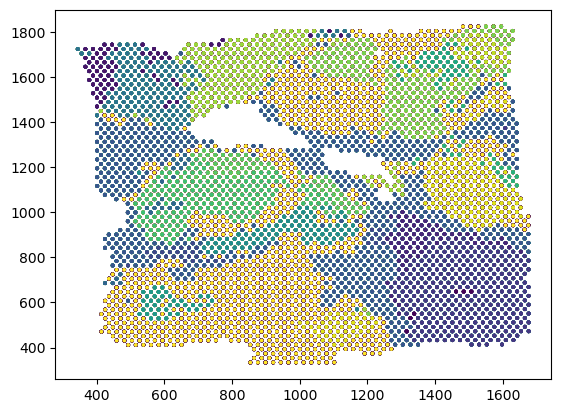

In [35]:
else_index = enhanced_input_graphm.index
louvain_iter_num = 0
result  = pd.DataFrame(index = coor.index)
result['result'] = 0

while True:
    louvain_iter_num +=1
    input_enhanced_ge = enhanced_gene.loc[else_index]
    if len(else_index) < 30:
        input_graphm = get_affinity(input_enhanced_ge, len(else_index)-1)
    else:
        input_graphm = get_affinity(input_enhanced_ge, 30)
    input_graphm.index =  input_enhanced_ge.index
    input_graphm.columns = input_enhanced_ge.index
    
    input_matrix = sr_matrix.loc[else_index, else_index]
    confidence_score = symmetric_confidence_score.loc[else_index, else_index]
    input_coor = coor.loc[else_index]

    G = load_graph(input_graphm,confidence_score)
    
    enhanced_algorithm = Louvain_se(G,confidence_score)
    enhanced_communities,enhanced_result,iter_time  = enhanced_algorithm.execute()

    enhanced_communities = sorted(enhanced_communities, key=lambda b: -len(b)) 
    enhanced_count = 0
    for enhanced_communitie in enhanced_communities:
        enhanced_count += 1

    enhanced_result_df = pd.DataFrame(index = input_graphm.index)
    enhanced_result_df = get_result(enhanced_result_df, enhanced_result)
    
    if len(else_index) < 30:
        neighbour1 = get_affinity(input_coor, len(else_index)-1)
    else:
        neighbour1 = get_affinity(input_coor, 30)
    neighbour1.index = input_coor.index
    neighbour1.columns = input_coor.index
    consensus_se1 = consensus(neighbour1,1,enhanced_result_df,24)
    if len(else_index) < 10:
        neighbour2 = get_affinity(input_coor, len(else_index)-1)
    else:
        neighbour2 = get_affinity(input_coor, 10)
    neighbour2.index = input_coor.index
    neighbour2.columns = input_coor.index
    consensus_se2 = consensus(neighbour2,1,consensus_se1,8)

    if len(consensus_se2[1].unique()) == 1:
        sp_cluster_num = consensus_se2[1].unique()
        spnode_index =consensus_se2[consensus_se2[1]==int(sp_cluster_num)].index
    else:
        consensus_se2['sc'] = silhouette_samples(input_matrix, consensus_se2[1], metric='precomputed')
        sp_cluster_num = consensus_se2.groupby(1)['sc'].mean().idxmax()
        spnode_index = consensus_se2[consensus_se2[1]==sp_cluster_num].index
        
    for i in spnode_index:
        result.loc[i]['result'] = louvain_iter_num
    plt.scatter(coor['imagecol'], coor['imagerow'],c = result['result'],s=3,label = result['result'])

    filename = f"weight_{weight}_iter_{louvain_iter_num}.png"
    
    
    plot_folder_path=os.path.join(data_path, 'results_plot')
    if not os.path.exists(plot_folder_path):
        os.mkdir(plot_folder_path)
        print(f"Directory '{plot_folder_path}' created successfully")
        
    save_plot_path = os.path.join(plot_folder_path, filename)
    plt.savefig(save_plot_path)

    print('iter time:',louvain_iter_num,'finished')
    else_index = consensus_se2[consensus_se2[1]!=int(sp_cluster_num)].index
    if len(else_index) == 0:
        print('Finished!')
        break
    
    


# Reconstruction of developmental path

In [93]:
pca = PCA(n_components=1)
pcage = pd.DataFrame(columns=enhanced_gene.columns)
for i in result['result'].unique():
    srge = enhanced_gene.loc[result[result['result']==i].index]

    reduced_data = pca.fit_transform(srge.T).T
    result_ge = pd.DataFrame(reduced_data, index=[i], columns=enhanced_gene.columns)
    pcage = pd.concat([pcage, result_ge], axis=0)

/tmp/ipykernel_296735/3231792689.py:8: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  pcage = pd.concat([pcage, result_ge], axis=0)


In [96]:
correlation_pcage = 1 - pairwise_distances(pcage, metric = 'cosine')
correlation_pcage = pd.DataFrame(correlation_pcage,index = pcage.index, columns=pcage.index).sort_index(axis=0).sort_index(axis=1)
correlation_pcage

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
1,1.000000,0.847271,0.907087,0.673446,0.874334,0.743700,0.708070,0.855952,0.892982,0.859128,0.770452,0.768338,0.309655,0.741153,0.795865,0.859889,0.877963,0.780404,0.704023,0.854656
2,0.847271,1.000000,0.871249,0.551018,0.802339,0.664689,0.742622,0.998283,0.859621,0.929923,0.769660,0.881237,0.231477,0.770126,0.835772,0.960565,0.991935,0.891459,0.683520,0.845224
3,0.907087,0.871249,1.000000,0.729475,0.900025,0.876381,0.761567,0.878142,0.902758,0.901528,0.799767,0.829364,0.500932,0.791038,0.847914,0.892836,0.902375,0.831632,0.744405,0.912806
4,0.673446,0.551018,0.729475,1.000000,0.623586,0.887633,0.465487,0.561101,0.607341,0.580866,0.512332,0.508214,0.796246,0.496163,0.541961,0.574677,0.595426,0.511504,0.498126,0.651560
5,0.874334,0.802339,0.900025,0.623586,1.000000,0.750590,0.724820,0.812518,0.889623,0.836019,0.744784,0.751803,0.337542,0.768510,0.811279,0.833848,0.840636,0.758776,0.634229,0.841479
6,0.743700,0.664689,0.876381,0.887633,0.750590,1.000000,0.575118,0.674805,0.719251,0.696761,0.610517,0.624497,0.843352,0.612384,0.663247,0.692784,0.710112,0.627092,0.565210,0.759329
7,0.708070,0.742622,0.761567,0.465487,0.724820,0.575118,1.000000,0.750120,0.819090,0.872652,0.957092,0.904038,0.193131,0.988251,0.974041,0.803854,0.766425,0.906445,0.702362,0.930310
8,0.855952,0.998283,0.878142,0.561101,0.812518,0.674805,0.750120,1.000000,0.868973,0.937336,0.781435,0.885953,0.238985,0.777247,0.843492,0.965090,0.994616,0.896583,0.691919,0.855649
9,0.892982,0.859621,0.902758,0.607341,0.889623,0.719251,0.819090,0.868973,1.000000,0.914520,0.837794,0.854318,0.279495,0.855002,0.893539,0.895113,0.891531,0.858880,0.850558,0.939762
10,0.859128,0.929923,0.901528,0.580866,0.836019,0.696761,0.872652,0.937336,0.914520,1.000000,0.888637,0.948650,0.257777,0.889622,0.940355,0.967509,0.944706,0.953965,0.764887,0.939631


## linkage

In [97]:
sr.index = coor.index
result['imagecol'] = coor['imagecol']
result['imagerow'] = coor['imagerow']
result['SR'] = sr['SR']


In [98]:
average_sr_by_superid = pd.DataFrame(result.groupby('result')['SR'].mean())

In [99]:
result

,result,imagecol,imagerow,SR
0,20,1437.953781,1314.933980,0.889871
1,8,502.640259,1489.603946,0.947698
2,4,1349.092396,609.158410,0.842841
3,6,435.478544,1254.290416,0.909897
4,2,772.524745,1764.521435,0.945194
...,...,...,...,...
3793,10,1157.013190,941.996690,0.921263
3794,17,761.798672,1470.462032,0.924935
3795,8,626.485142,1509.405926,0.937464
3796,6,593.234318,1215.346522,0.913466


In [100]:
coordinates = result[['imagecol', 'imagerow']].values  # 获取所有坐标（列坐标，行坐标）
labels = result['result'].values 
# 获取唯一的 domain
unique_labels = np.unique(labels)

distance_matrix = np.zeros((len(unique_labels), len(unique_labels)))

# 计算每对 domain 之间的最小距离
for i, label_i in enumerate(unique_labels):
    points_i = coordinates[labels == label_i]  # 属于 domain i 的点
    for j, label_j in enumerate(unique_labels):
        if i == j:
            distance_matrix[i, j] = 0  # 自己到自己的距离为 0
        else:
            points_j = coordinates[labels == label_j]  # 属于 domain j 的点
            # 计算两组点之间的最小距离
            min_distance = np.min(distance.cdist(points_i, points_j))
            distance_matrix[i, j] = min_distance

# 转换为 DataFrame，便于展示
distance_matrix_df = pd.DataFrame(distance_matrix, index=unique_labels, columns=unique_labels)



In [101]:
distance_matrix_df

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
1,0.000000,1171.721632,39.073472,22.524752,303.729757,22.524752,842.054077,1073.335221,162.491572,396.070196,590.655672,902.693921,483.624520,547.975696,444.389595,125.435038,140.726885,921.213183,98.339485,59.676512
2,1171.721632,0.000000,804.448278,635.661058,612.746562,22.607411,222.862221,22.524752,222.344119,304.385291,803.689328,196.734689,439.501025,251.919253,226.079064,39.073472,22.524752,238.877557,508.437581,22.586473
3,39.073472,804.448278,0.000000,22.524752,22.524752,22.524752,622.315165,725.137451,117.171999,98.263758,524.032806,560.244536,218.249855,196.527516,78.105684,90.099160,78.382881,586.936504,22.616894,59.625841
4,22.524752,635.661058,22.524752,0.000000,119.438779,22.524752,706.148895,640.110388,135.148740,206.954146,532.659932,260.386168,125.898100,351.578690,234.358290,103.237045,112.624033,251.581712,39.191506,59.703200
5,303.729757,612.746562,22.524752,119.438779,0.000000,22.524752,45.162170,511.639140,295.933354,22.524903,125.790856,652.598720,311.020427,22.586473,81.521575,313.614390,170.763377,681.278254,176.159751,22.524752
6,22.524752,22.607411,22.524752,22.524752,22.524752,0.000000,22.524903,22.524752,39.043493,22.524752,45.049580,45.049580,22.524752,22.524752,22.524752,22.524752,22.524752,22.657943,22.524752,22.524752
7,842.054077,222.862221,622.315165,706.148895,45.162170,22.524903,0.000000,119.759268,399.647104,78.146943,78.146943,722.726442,664.858595,22.524752,22.524752,542.308243,158.410726,742.176536,558.096013,22.524752
8,1073.335221,22.524752,725.137451,640.110388,511.639140,22.524752,119.759268,0.000000,81.611671,215.690406,705.929097,200.638096,444.746844,148.350659,125.790856,45.203227,22.524752,244.209883,509.979515,22.524752
9,162.491572,222.344119,117.171999,135.148740,295.933354,39.043493,399.647104,81.611671,0.000000,304.365878,429.850926,368.881578,531.365205,391.997399,320.770896,39.073472,22.524752,384.997473,22.545294,22.524752
10,396.070196,304.385291,98.263758,206.954146,22.524903,22.524752,78.146943,215.690406,304.365878,0.000000,195.957528,607.368313,303.792250,22.524752,22.524752,333.214172,148.107480,629.626343,234.415290,22.524752


In [102]:
average_sr_matrix = pd.DataFrame(index = average_sr_by_superid.index, columns = average_sr_by_superid.index)
for i in average_sr_matrix.index:
    average_sr_matrix[i] = abs(average_sr_by_superid['SR'] - average_sr_by_superid['SR'][i])

In [103]:
def zscore(distance_matrix):
    upper_triangle = distance_matrix.where(np.triu(np.ones(distance_matrix.shape), k=1).astype(bool))
    
    mean = upper_triangle.stack().mean()
    std = upper_triangle.stack().std()
    

    zscore_matrix = (distance_matrix - mean) / std

    zscore_matrix = (zscore_matrix + zscore_matrix.T) / 2
    
    return zscore_matrix

In [105]:
distance_zscore = zscore(distance_matrix_df)
average_sr_zscore = zscore(average_sr_matrix)
correlation_zscore= zscore(correlation_pcage)

In [106]:
combined_df = weight_sr*average_sr_zscore + weight_dis*distance_zscore + weight_corr*correlation_zscore
for i in range(len(combined_df)):
    combined_df.iat[i, i] = 0
combined_df

result,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
result,,,,,,,,,,,,,,,,,,,,
1,0.000000,2.361497,-0.345431,-0.450335,-0.023047,-0.746443,1.524885,2.101719,0.058886,0.488418,0.903506,1.584259,0.295243,0.812446,0.608392,-0.040584,-0.017204,1.714530,-0.193492,-0.346876
2,2.361497,0.000000,1.914059,1.424452,1.197169,-0.383312,-0.351894,-0.653714,-0.253212,0.041859,1.051992,-0.232642,0.096722,-0.201388,-0.225470,-0.611994,-0.612969,-0.215850,0.309459,-0.551168
3,-0.345431,1.914059,0.000000,-0.783656,-0.495018,-0.316885,1.422524,1.696040,0.324390,0.205767,1.131320,1.211244,0.161062,0.413620,0.177483,0.259069,0.217681,1.354799,0.019611,0.044560
4,-0.450335,1.424452,-0.783656,0.000000,-0.367941,-0.259882,1.510325,1.395424,0.265213,0.336634,1.055299,0.427973,0.156347,0.661343,0.422244,0.177470,0.189005,0.492647,-0.017644,-0.037230
5,-0.023047,1.197169,-0.495018,-0.367941,0.000000,-0.633962,-0.140186,0.932069,0.464639,-0.249990,-0.040481,1.125352,0.032331,-0.239887,-0.086485,0.476045,0.139916,1.275752,0.053960,-0.327734
6,-0.746443,-0.383312,-0.316885,-0.259882,-0.633962,0.000000,-0.457359,-0.422460,-0.387079,-0.511199,-0.479756,-0.488799,-0.545252,-0.509836,-0.484140,-0.437229,-0.448436,-0.454873,-0.515098,-0.559819
7,1.524885,-0.351894,1.422524,1.510325,-0.140186,-0.457359,0.000000,-0.590949,0.094546,-0.521608,-0.503585,0.927401,0.553089,-0.631471,-0.638475,0.405598,-0.452192,0.889446,0.401966,-0.536098
8,2.101719,-0.653714,1.696040,1.395424,0.932069,-0.422460,-0.590949,0.000000,-0.607372,-0.196886,0.795192,-0.265628,0.068164,-0.473554,-0.489992,-0.640097,-0.655725,-0.245431,0.273069,-0.590111
9,0.058886,-0.253212,0.324390,0.265213,0.464639,-0.387079,0.094546,-0.607372,0.000000,-0.034399,0.182134,0.070349,0.258344,0.086881,-0.052552,-0.713133,-0.732531,0.057751,-0.760614,-0.571452


/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


自定义距离矩阵聚类方式：
每个簇的成员： [[12 19]
 [16 18]
 [ 2  3]
 [11 20]
 [15 21]
 [ 0  5]
 [ 8 24]
 [ 9 13]
 [14 27]
 [17 23]
 [ 1  7]
 [ 6 28]
 [26 29]
 [ 4 22]
 [25 33]
 [30 31]
 [32 35]
 [10 36]
 [34 37]]
聚类过程： [[11.         17.          0.93848504  2.        ]
 [ 1.          7.          1.22480918  2.        ]
 [ 5.         19.          1.23570038  2.        ]
 [ 9.         13.          1.24020162  2.        ]
 [14.         23.          1.31299073  3.        ]
 [ 0.          2.          1.51968865  2.        ]
 [16.         22.          1.62632683  3.        ]
 [ 8.         15.          1.94400696  2.        ]
 [18.         26.          2.03261747  4.        ]
 [ 3.         25.          2.05983403  3.        ]
 [12.         27.          2.10804249  3.        ]
 [28.         30.          2.27873107  7.        ]
 [24.         31.          2.50152154 10.        ]
 [ 4.         10.          2.73749101  2.        ]
 [20.         21.          2.92265326  4.        ]
 [29.         33.          3.4461665

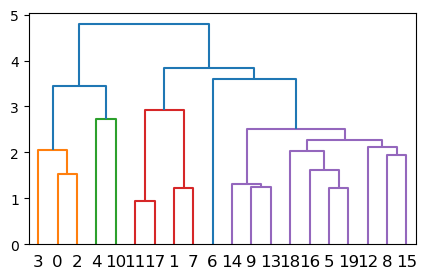

In [107]:

model = AgglomerativeClustering(n_clusters=1, affinity='precomputed', linkage='average')
clustering2 = model.fit(combined_df)

print("自定义距离矩阵聚类方式：")
# print("每个数据所属的簇编号：", clustering2.labels_)
print("每个簇的成员：", clustering2.children_)

# 调整距离矩阵的形状
dist_matrix = distance.squareform(combined_df)

# linkage方法用于计算两个聚类簇s和t之间的距离d(s,t)
# 层次聚类编码为一个linkage矩阵。
Z = linkage(combined_df, 'average')
print("聚类过程：", Z)

fig = plt.figure(figsize=(5, 3))
dn = dendrogram(Z)
plt.show()

In [108]:
linkage_result = pd.DataFrame(clustering2.children_+1)

In [109]:
new_node_index = average_sr_matrix.index.max()+1
new_index = range(new_node_index, new_node_index + len(linkage_result))

# 设置新的索引
linkage_result.index = new_index
cluster_cell = {}
for i in result['result'].unique():
    cluster_cell[i] = set(result[result['result'] == i].index)
for i in linkage_result.index:
    cluster_cell[i] = cluster_cell[linkage_result.loc[i,0]].union(cluster_cell[linkage_result.loc[i,1]])

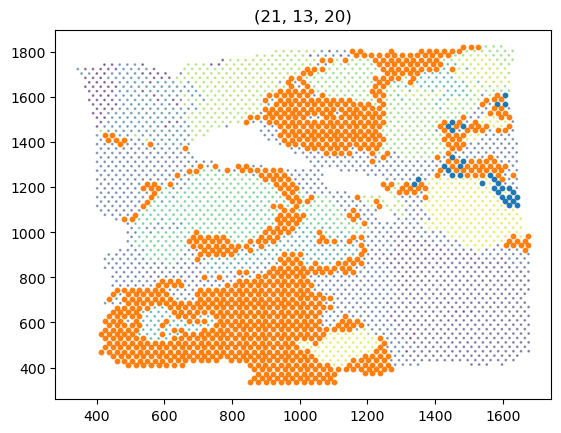

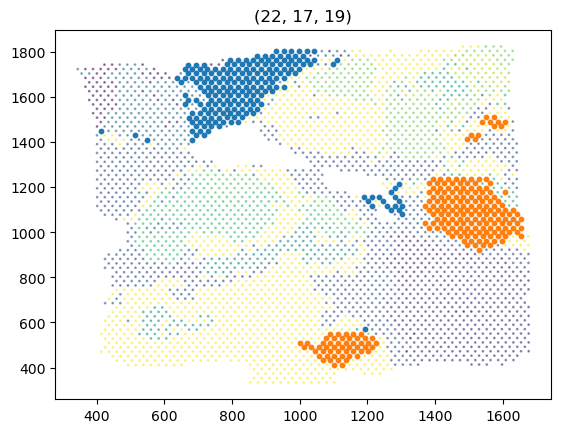

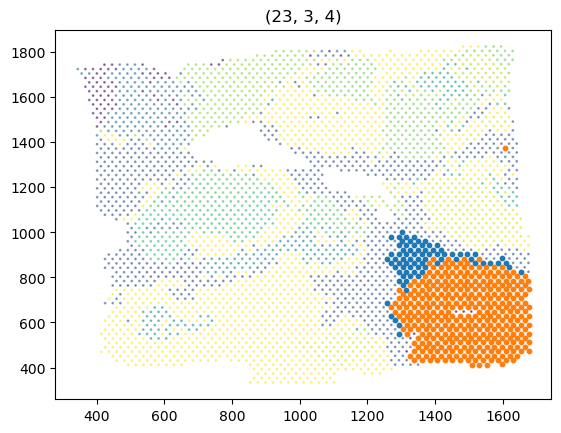

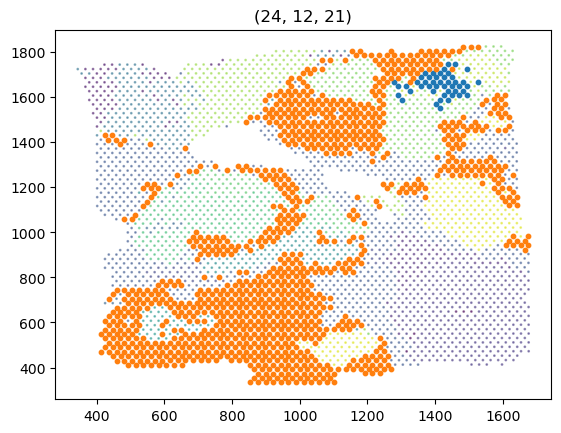

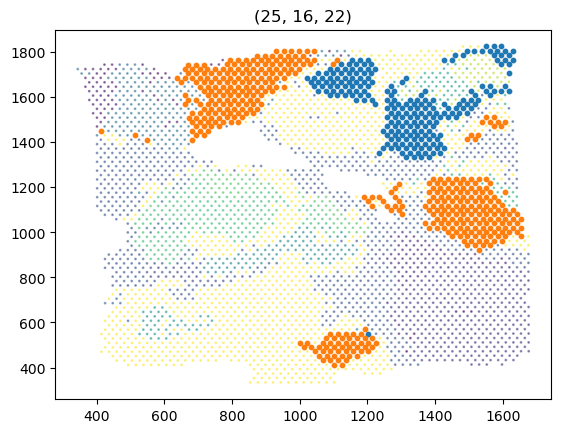

...

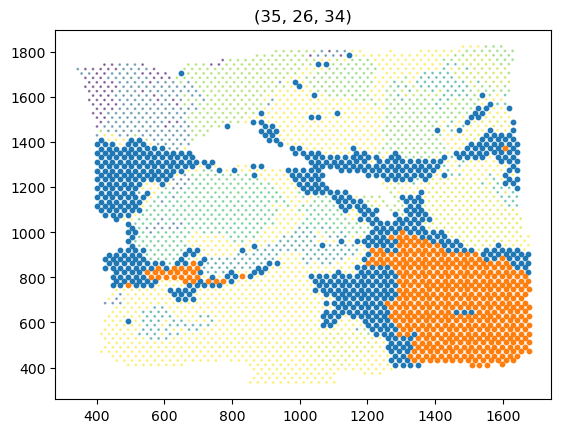

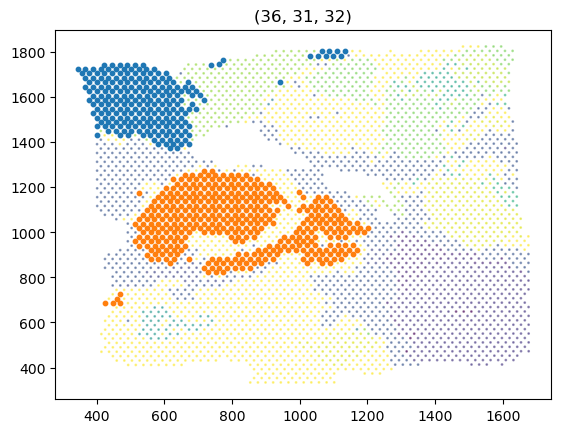

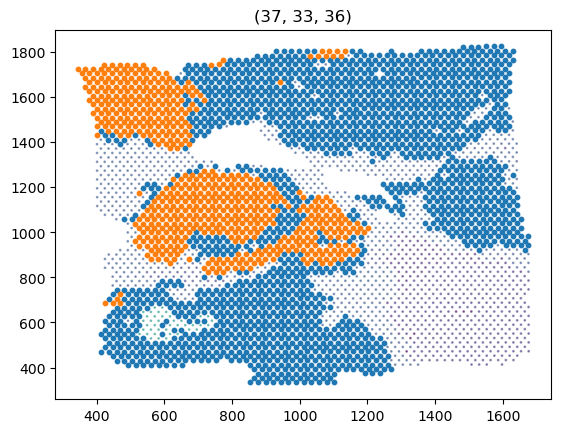

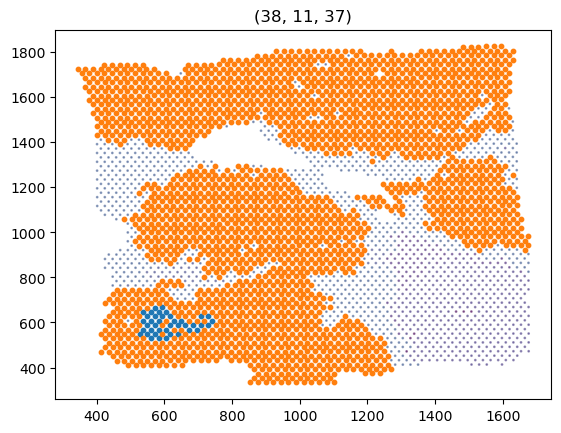

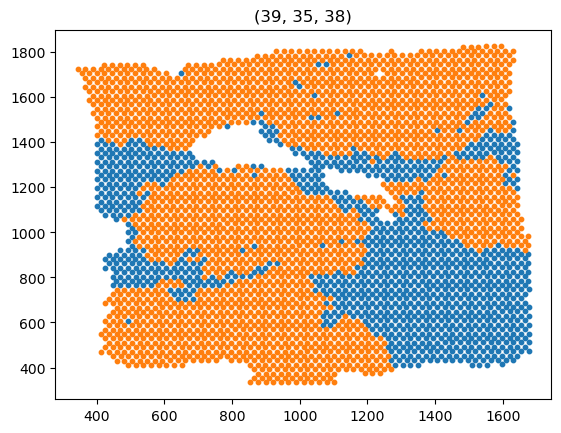

In [110]:
for i in linkage_result.index:
    plt.scatter(coor['imagecol'], coor['imagerow'],c = result['result'],alpha=0.5,s=1,label = result['result'])
    plt.scatter(coor['imagecol'][list(cluster_cell[linkage_result.loc[i,0]])], 
                coor['imagerow'][list(cluster_cell[linkage_result.loc[i,0]])],
                s = 10)

    plt.scatter(coor['imagecol'][list(cluster_cell[linkage_result.loc[i,1]])], 
                coor['imagerow'][list(cluster_cell[linkage_result.loc[i,1]])],
                s = 10)

    
    filename = f"{linkage_result.loc[i,0]}_{linkage_result.loc[i,1]}_{i}.png"
    linkage_plot_folder_path=os.path.join(data_path, 'linkage_plot')
    if not os.path.exists(linkage_plot_folder_path):
        os.mkdir(linkage_plot_folder_path)
        print(f"Directory '{linkage_plot_folder_path}' created successfully")
        
    save_plot_path = os.path.join(linkage_plot_folder_path, filename)

    plt.savefig(save_plot_path,dpi=300)
    plt.title((i,linkage_result.loc[i,0],linkage_result.loc[i,1]))
    plt.show()

Directory '/home/jovyan/shared/zhangdisong/cnv/linkage_node_plot' created successfully


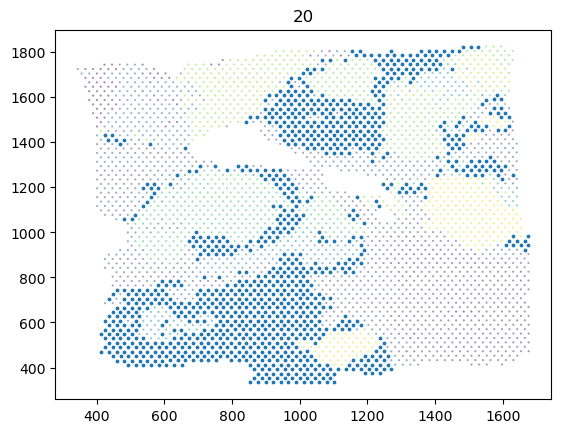

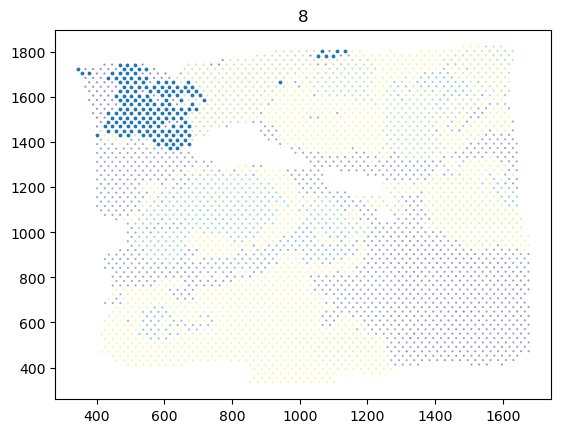

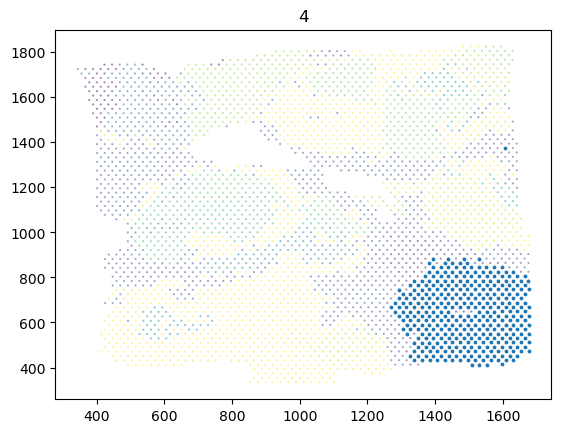

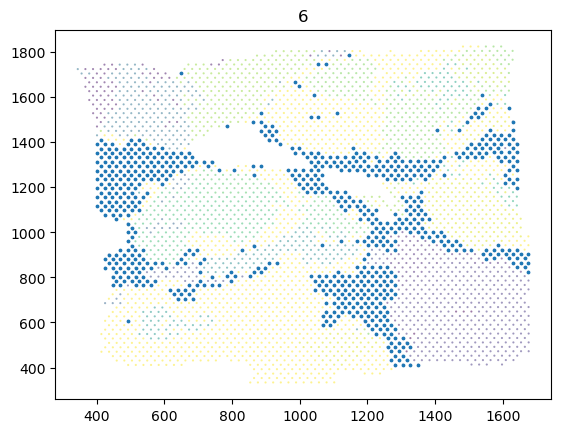

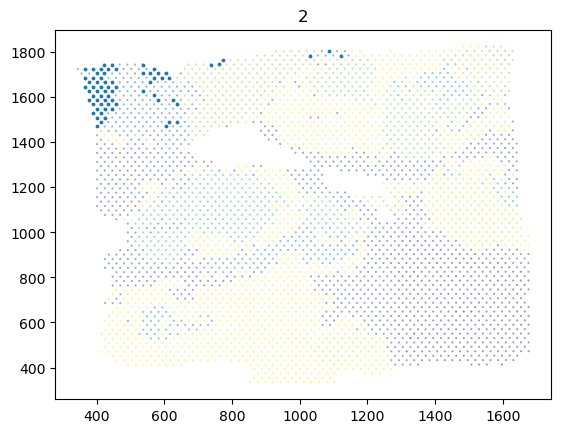

...

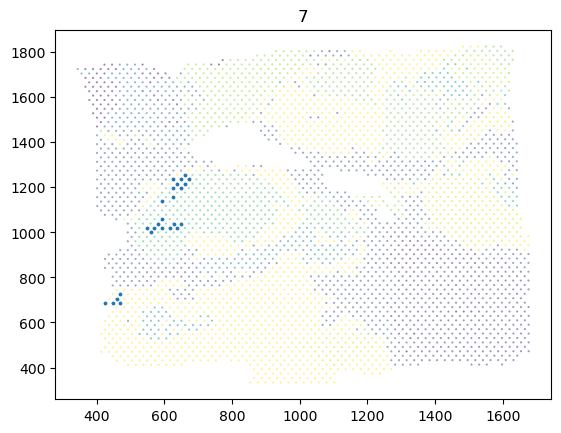

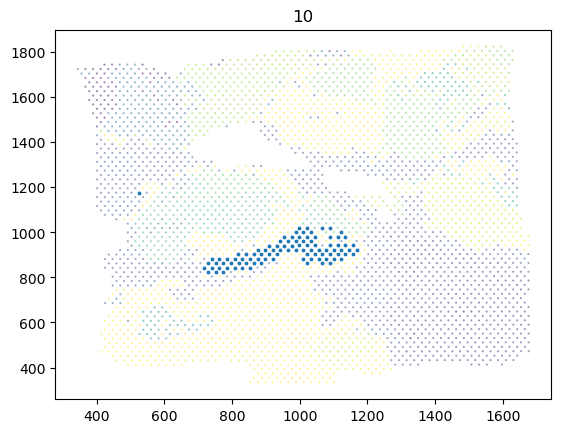

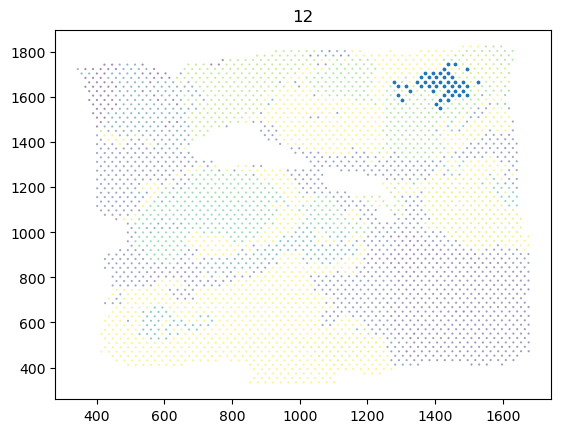

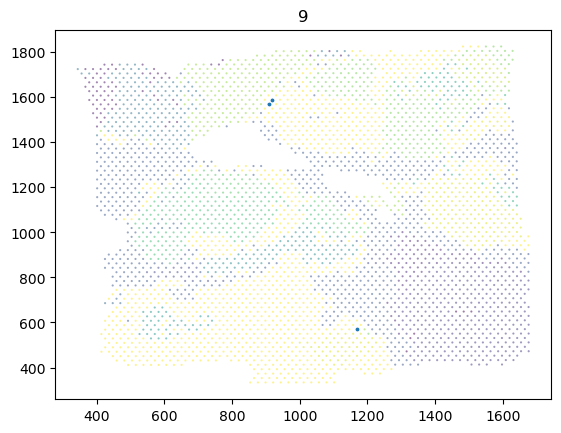

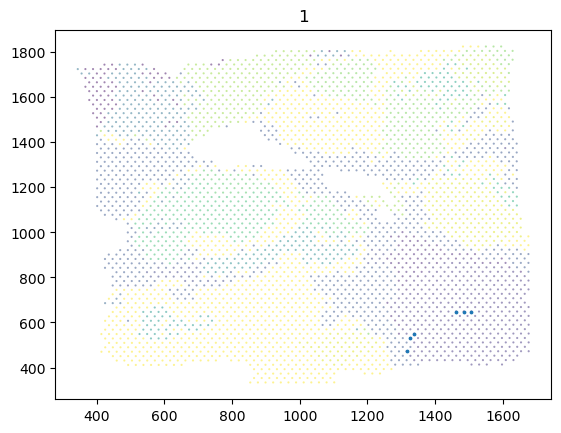

In [113]:
for i in result['result'].unique():
    plt.scatter(coor['imagecol'], coor['imagerow'],c = result['result'],alpha=0.5,s=0.3,label = result['result'])
    plt.scatter(coor['imagecol'][list(cluster_cell[i])], 
                coor['imagerow'][list(cluster_cell[i])],
                s = 3)

    filename = f"{i}.png"
    linkage_node_folder_path=os.path.join(data_path, 'linkage_node_plot')
    if not os.path.exists(linkage_node_folder_path):
        os.mkdir(linkage_node_folder_path)
        print(f"Directory '{linkage_node_folder_path}' created successfully")
    
    save_node_path = os.path.join(linkage_node_folder_path, filename)

    plt.savefig(save_path,dpi=300)
    plt.title(i)
    plt.show()